In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import gwaslab as gl

In [2]:
# The most significant SNP on each chromosome 
def sig_snps(dataset):
    significant_snps = dataset[dataset['Pval'] < 5e-6]
    min_p_snps = significant_snps.groupby('Chr')['Pval'].min().reset_index()
    result = pd.merge(min_p_snps, significant_snps, on=['Chr', 'Pval'], how='left')
    for index, row in result.iterrows():
        chromosome = row['Chr']
        snp_name = row['Name']
        print(f"'Chr{chromosome}:{snp_name}',")

# Create Manhattan plot
def manhattan(dataset, title, cutfactor, annoset, annotext, cut=10, save=True):    
    dataset['SE'] = dataset['Info'].str.extract(r';SE=(.*?);').astype(float)
    dataset['N'] = dataset['Num_Cases'] + dataset['Num_Controls']
    mysumstats = gl.Sumstats(dataset,
                 snpid="Name",
                 chrom="Chr",
                 pos="Pos",
                 ea="Alt",
                 nea="Ref",
                 neaf="AAF",
                 beta="Effect",
                 se="SE",
                 p="Pval",
                 n="N",
                 build="19")
    
    mysumstats.plot_mqq(mode="m",
                       skip=1, 
                       sig_level=5e-8,
                       cut=cut, 
                       cut_line_color='#FFFFFF00',   
                       cutfactor=cutfactor,          
                       anno=True,
                       anno_set= annoset, 
                       anno_alias=annotext,
                       stratified=True,  
                       marker_size=(5,10),
                       suggestive_sig_line=True,
                       colors=["#527865","#94d4bc"],
                       mtitle=title,
                       title_pad=1.2,
                       figargs={"figsize":(15,5),"dpi":300},
                       fontsize = 12,
                       anno_fontsize = 10,
                       title_fontsize = 20)
    if save:
        plt.savefig(f'{title}_manhattan.png', dpi=500, bbox_inches='tight', facecolor='white')
        print(f"Figure saved as: {title}_manhattan.png")
    
    return None

## A4

In [5]:
A4 = pd.read_csv('/Your_path/cluster2_concat.cl4.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(A4)

'Chr1:rs11588934',
'Chr4:rs6817628',
'Chr6:rs60628212',
'Chr8:rs80344830',
'Chr10:rs148892893',
'Chr11:rs12794482',
'Chr19:rs55977254',
'Chr20:rs117634158',


2025/10/14 15:11:14 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 15:11:14 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 15:11:14 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 15:11:14 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 15:11:38  -Reading columns          : AAF,Effect,Pval,Name,Chr,Ref,N,Alt,Pos,SE
2025/10/14 15:11:38  -Renaming columns to      : EAF,BETA,P,SNPID,CHR,NEA,N,EA,POS,SE
2025/10/14 15:11:38  -Current Dataframe shape : 46996239  x  10
2025/10/14 15:11:43  -Initiating a status column: STATUS ...
2025/10/14 15:11:43  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 15:11:48  -NEAF is specified...
2025/10/14 15:11:48  -Checking if 0<= NEAF <=1 ...
2025/10/14 15:11:52  -Converted NEAF to EAF.
2025/10/14 15:11:52  -Removed 0 variants with bad NEAF.
2025/10/14 15:11:53 Start to reorder the columns...v3.6.0
2025/10/14 15

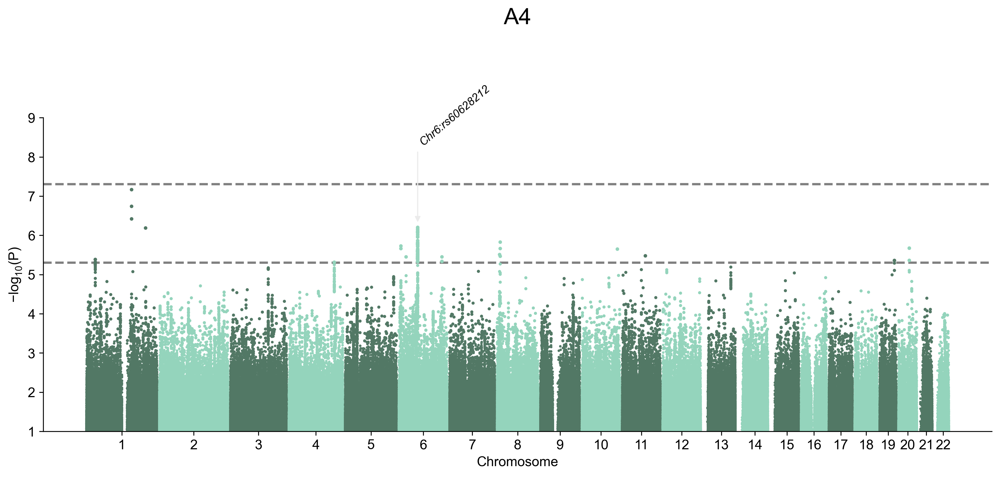

In [7]:
manhattan(A4,'A4',None,['rs60628212'],{'rs60628212':'Chr6:rs60628212'},cut=1,save=True)

## A6

In [3]:
A6 = pd.read_csv('/Your_path/cluster2_concat.cl6.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(A6)

'Chr1:rs583731',
'Chr2:rs71415578',
'Chr4:rs549158690',
'Chr5:rs146156433',
'Chr6:rs9469008',
'Chr8:rs4841431',
'Chr9:rs10983706',
'Chr11:rs77890156',
'Chr12:rs7959278',
'Chr13:rs79815694',
'Chr16:rs4451931',
'Chr17:rs1419060804',
'Chr18:rs182542408',
'Chr19:rs77063268',


2025/10/14 15:41:19 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 15:41:19 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 15:41:19 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 15:41:19 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 15:41:40  -Reading columns          : Pos,SE,Pval,Chr,Effect,AAF,Alt,Name,Ref,N
2025/10/14 15:41:40  -Renaming columns to      : POS,SE,P,CHR,BETA,EAF,EA,SNPID,NEA,N
2025/10/14 15:41:40  -Current Dataframe shape : 46430057  x  10
2025/10/14 15:41:45  -Initiating a status column: STATUS ...
2025/10/14 15:41:45  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 15:41:50  -NEAF is specified...
2025/10/14 15:41:50  -Checking if 0<= NEAF <=1 ...
2025/10/14 15:41:56  -Converted NEAF to EAF.
2025/10/14 15:41:56  -Removed 0 variants with bad NEAF.
2025/10/14 15:41:57 Start to reorder the columns...v3.6.0
2025/10/14 15

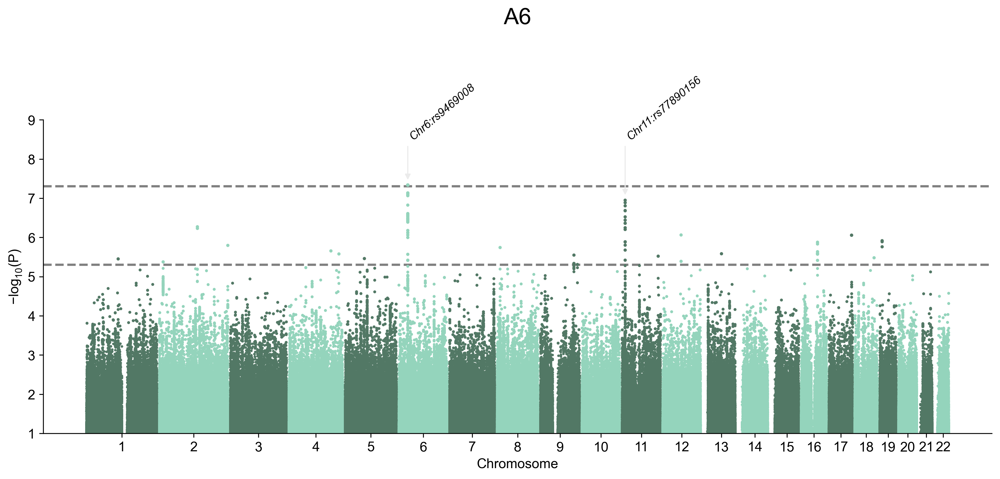

In [7]:
manhattan(A6,'A6',None,['rs9469008','rs77890156'],{'rs9469008':'Chr6:rs9469008','rs77890156':'Chr11:rs77890156'},
          cut=1,save=True)

## A9 

In [3]:
A9 = pd.read_csv('/Your_path/comp_concat.cl1.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(A9)

'Chr1:rs6426007',
'Chr2:rs565985555',
'Chr3:rs191561699',
'Chr5:rs116097828',
'Chr6:rs41269597',
'Chr7:rs73235843',
'Chr8:rs2976386',
'Chr10:rs10781559',
'Chr11:rs71484134',
'Chr12:rs61914868',
'Chr13:rs189552875',
'Chr17:rs73294315',
'Chr18:rs139458020',
'Chr19:rs9749607',


2025/10/14 16:14:11 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 16:14:11 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 16:14:11 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 16:14:11 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 16:14:30  -Reading columns          : Ref,Name,N,Effect,Pval,Chr,Alt,Pos,AAF,SE
2025/10/14 16:14:30  -Renaming columns to      : NEA,SNPID,N,BETA,P,CHR,EA,POS,EAF,SE
2025/10/14 16:14:30  -Current Dataframe shape : 44590173  x  10
2025/10/14 16:14:34  -Initiating a status column: STATUS ...
2025/10/14 16:14:34  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 16:14:39  -NEAF is specified...
2025/10/14 16:14:39  -Checking if 0<= NEAF <=1 ...
2025/10/14 16:14:42  -Converted NEAF to EAF.
2025/10/14 16:14:42  -Removed 0 variants with bad NEAF.
2025/10/14 16:14:43 Start to reorder the columns...v3.6.0
2025/10/14 16

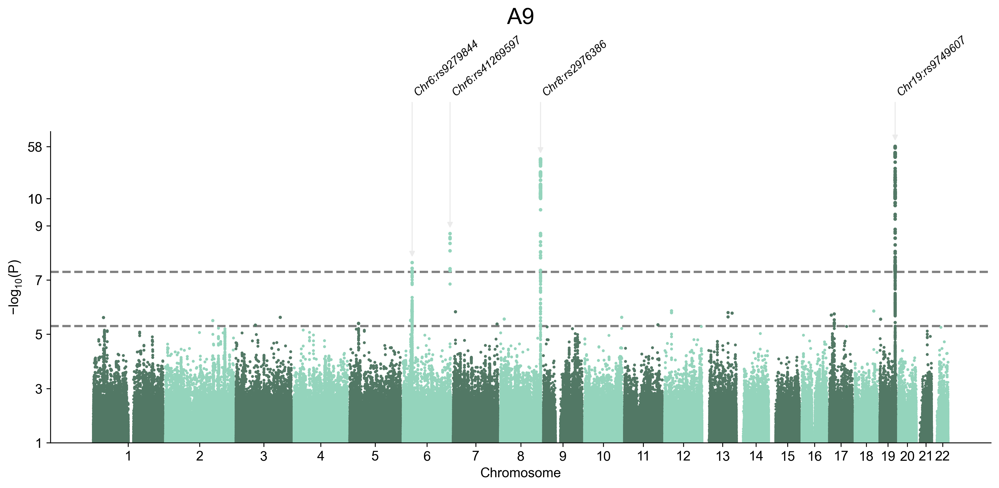

In [7]:
manhattan(A9,'A9',25,['rs41269597','rs9279844','rs2976386','rs9749607'],
          {'rs41269597':'Chr6:rs41269597','rs9279844':'Chr6:rs9279844','rs2976386':'Chr8:rs2976386','rs9749607':'Chr19:rs9749607'},save=True)

## A10

In [3]:
A10 = pd.read_csv('/Your_path/comp_concat.cl2.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(A10)

'Chr1:rs1090244',
'Chr2:rs567275305',
'Chr3:rs114513574',
'Chr4:rs147646095',
'Chr7:rs4720213',
'Chr8:rs2976398',
'Chr9:rs117070164',
'Chr10:rs139856753',
'Chr13:rs142564463',
'Chr14:rs11629409',
'Chr19:rs3826877',


2025/10/14 16:31:59 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 16:31:59 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 16:31:59 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 16:31:59 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 16:32:18  -Reading columns          : Chr,AAF,Name,N,Effect,Ref,Pval,Alt,Pos,SE
2025/10/14 16:32:18  -Renaming columns to      : CHR,EAF,SNPID,N,BETA,NEA,P,EA,POS,SE
2025/10/14 16:32:18  -Current Dataframe shape : 44673893  x  10
2025/10/14 16:32:22  -Initiating a status column: STATUS ...
2025/10/14 16:32:22  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 16:32:27  -NEAF is specified...
2025/10/14 16:32:27  -Checking if 0<= NEAF <=1 ...
2025/10/14 16:32:31  -Converted NEAF to EAF.
2025/10/14 16:32:31  -Removed 0 variants with bad NEAF.
2025/10/14 16:32:32 Start to reorder the columns...v3.6.0
2025/10/14 16

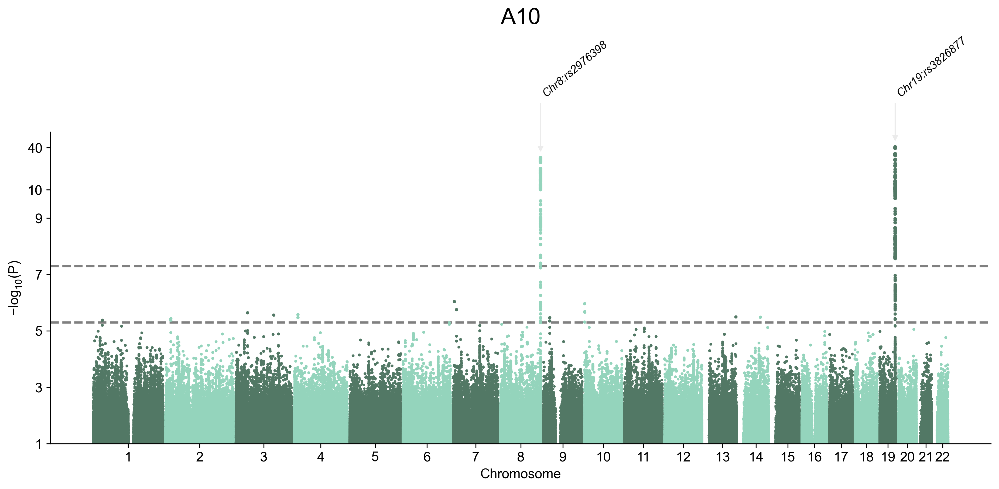

In [5]:
# comp2
manhattan(A10,'A10',20,['rs2976398','rs3826877'],{'rs2976398':'Chr8:rs2976398','rs3826877':'Chr19:rs3826877'},save=True)

## A11

In [3]:
A11 = pd.read_csv('/Your_path/comp_concat.cl3.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(A11)

'Chr6:rs2857129',
'Chr7:rs550828696',
'Chr8:rs2976398',
'Chr9:rs577340587',
'Chr14:rs74394317',
'Chr19:rs76248118',


2025/10/14 17:17:25 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 17:17:25 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 17:17:25 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 17:17:25 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 17:17:46  -Reading columns          : Alt,Pos,Name,N,Effect,Ref,AAF,Pval,SE,Chr
2025/10/14 17:17:46  -Renaming columns to      : EA,POS,SNPID,N,BETA,NEA,EAF,P,SE,CHR
2025/10/14 17:17:46  -Current Dataframe shape : 44630167  x  10
2025/10/14 17:17:51  -Initiating a status column: STATUS ...
2025/10/14 17:17:51  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 17:17:56  -NEAF is specified...
2025/10/14 17:17:56  -Checking if 0<= NEAF <=1 ...
2025/10/14 17:18:00  -Converted NEAF to EAF.
2025/10/14 17:18:00  -Removed 0 variants with bad NEAF.
2025/10/14 17:18:01 Start to reorder the columns...v3.6.0
2025/10/14 17

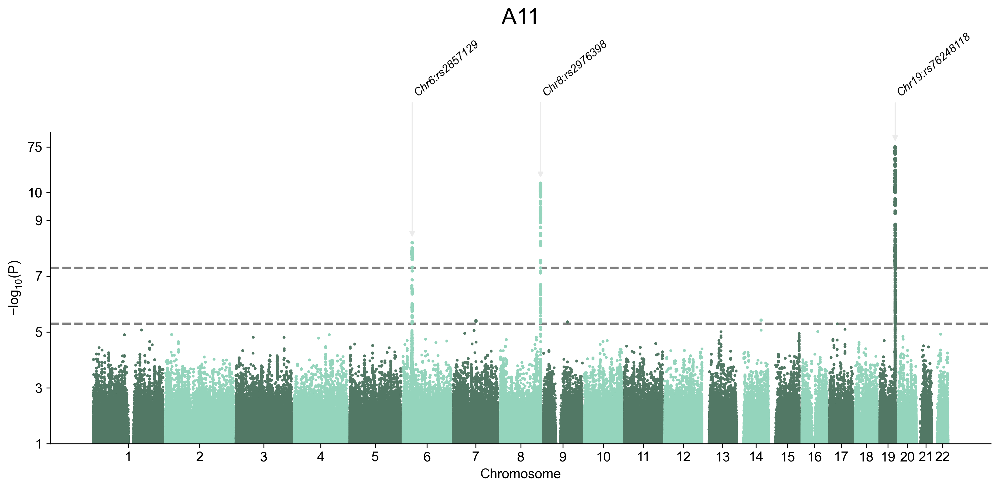

In [10]:
manhattan(A11,'A11',40,['rs2857129','rs2976398','rs76248118'],
          {'rs2857129':'Chr6:rs2857129','rs2976398':'Chr8:rs2976398','rs76248118':'Chr19:rs76248118'},save=True)

## A12

In [5]:
A12 = pd.read_csv('/Your_path/comp_concat.cl4.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(A12)

'Chr1:rs137854925',
'Chr3:rs62273811',
'Chr8:rs5895729',
'Chr15:rs190299280',
'Chr19:rs9749607',
'Chr21:rs77033838',
'Chr22:rs5751776',


2025/10/14 18:13:19 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 18:13:19 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 18:13:19 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 18:13:19 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 18:13:37  -Reading columns          : Effect,Ref,AAF,Name,N,Chr,Pval,Alt,Pos,SE
2025/10/14 18:13:37  -Renaming columns to      : BETA,NEA,EAF,SNPID,N,CHR,P,EA,POS,SE
2025/10/14 18:13:37  -Current Dataframe shape : 44672241  x  10
2025/10/14 18:13:40  -Initiating a status column: STATUS ...
2025/10/14 18:13:40  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 18:13:44  -NEAF is specified...
2025/10/14 18:13:44  -Checking if 0<= NEAF <=1 ...
2025/10/14 18:13:47  -Converted NEAF to EAF.
2025/10/14 18:13:47  -Removed 0 variants with bad NEAF.
2025/10/14 18:13:47 Start to reorder the columns...v3.6.0
2025/10/14 18

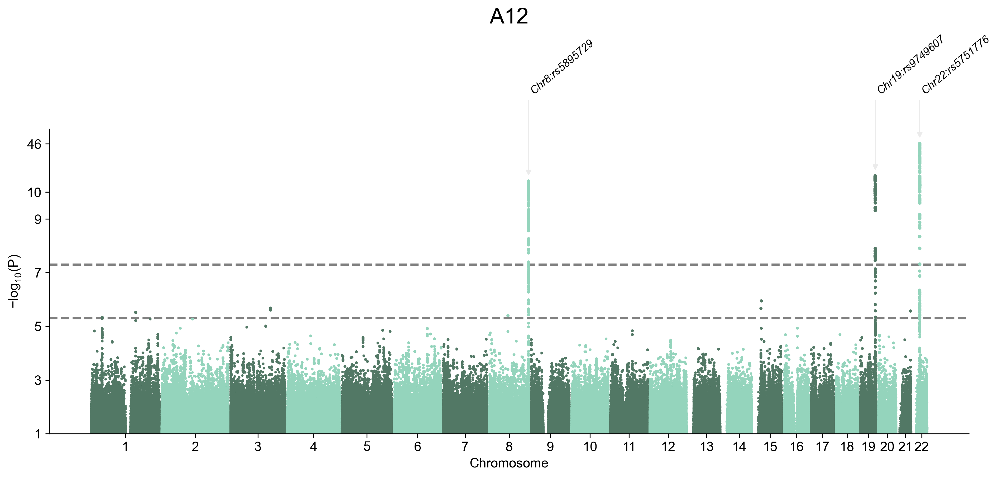

In [9]:
figure = manhattan(A12,'A12',20,['rs5895729','rs9749607','rs5751776'],
                   {'rs5895729':'Chr8:rs5895729','rs9749607':'Chr19:rs9749607','rs5751776':'Chr22:rs5751776'},save=True)

## A25

In [5]:
A25 = pd.read_csv('/Your_path/3k_concat.cl4.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [8]:
sig_snps(A25)

'Chr5:rs143794810',
'Chr6:rs117511118',
'Chr8:rs115984024',
'Chr10:rs61861335',
'Chr22:rs1006771',


2025/09/27 23:37:37 GWASLab v3.6.3 https://cloufield.github.io/gwaslab/
2025/09/27 23:37:37 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/09/27 23:37:37 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/09/27 23:37:37 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/09/27 23:37:54  -Reading columns          : Chr,Alt,Pval,Effect,SE,N,Name,Pos,Ref,AAF
2025/09/27 23:37:54  -Renaming columns to      : CHR,EA,P,BETA,SE,N,SNPID,POS,NEA,EAF
2025/09/27 23:37:54  -Current Dataframe shape : 44847026  x  10
2025/09/27 23:37:56  -Initiating a status column: STATUS ...
2025/09/27 23:37:56  -Genomic coordinates are based on GRCh37/hg19...
2025/09/27 23:38:00  -NEAF is specified...
2025/09/27 23:38:00  -Checking if 0<= NEAF <=1 ...
2025/09/27 23:38:02  -Converted NEAF to EAF.
2025/09/27 23:38:02  -Removed 0 variants with bad NEAF.
2025/09/27 23:38:02 Start to reorder the columns...v3.6.3
2025/09/27 23

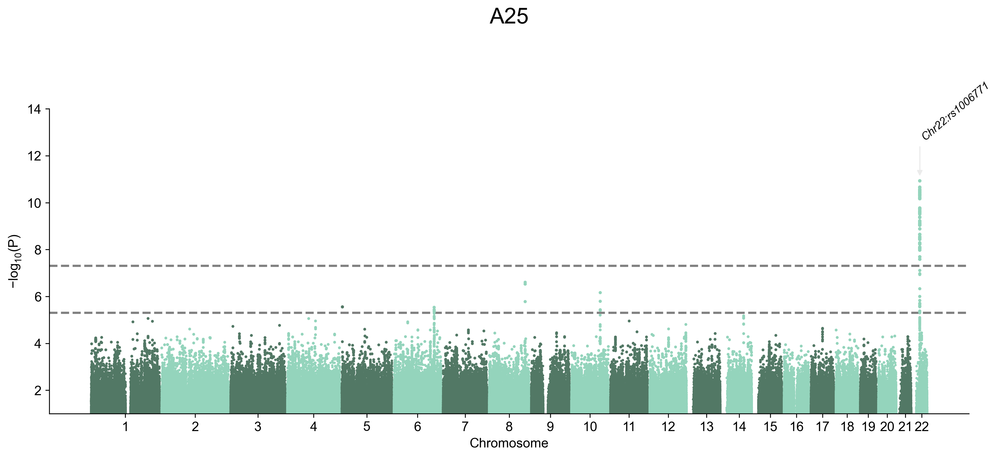

In [6]:
manhattan(A25,'A25',None,['rs1006771'],{'rs1006771':'Chr22:rs1006771'},cut=1,save=True)

## A33

In [5]:
A33 = pd.read_csv('/Your_path/3k_concat.cl12.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(A33)

'Chr1:rs12136529',
'Chr2:rs182801540',
'Chr3:rs11923634',
'Chr10:rs190288835',
'Chr15:rs12591859',
'Chr19:rs73070113',


2025/10/14 18:38:39 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 18:38:39 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 18:38:39 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 18:38:39 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 18:38:58  -Reading columns          : N,Effect,Alt,SE,AAF,Name,Pval,Chr,Ref,Pos
2025/10/14 18:38:58  -Renaming columns to      : N,BETA,EA,SE,EAF,SNPID,P,CHR,NEA,POS
2025/10/14 18:38:58  -Current Dataframe shape : 44984172  x  10
2025/10/14 18:39:01  -Initiating a status column: STATUS ...
2025/10/14 18:39:01  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 18:39:05  -NEAF is specified...
2025/10/14 18:39:05  -Checking if 0<= NEAF <=1 ...
2025/10/14 18:39:07  -Converted NEAF to EAF.
2025/10/14 18:39:07  -Removed 0 variants with bad NEAF.
2025/10/14 18:39:08 Start to reorder the columns...v3.6.0
2025/10/14 18

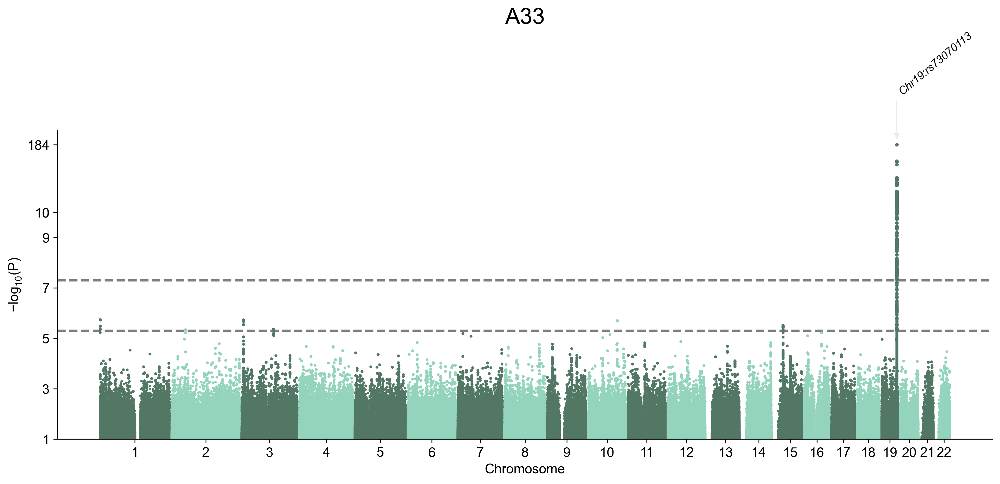

In [7]:
manhattan(A33,'A33',65,['rs73070113'],{'rs73070113':'Chr19:rs73070113'},save=True)

## B1

In [5]:
B1 = pd.read_csv('/Your_path/leiden_concat.cl1.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B1)

'Chr1:rs6692022',
'Chr2:chr2:173764280_A_ATG',
'Chr3:rs990623',
'Chr4:rs556766153',
'Chr5:rs575304910',
'Chr6:rs116497413',
'Chr7:rs56361744',
'Chr8:rs117786293',
'Chr9:rs796944515',
'Chr10:rs2286779',
'Chr11:rs7104150',
'Chr12:rs10860165',
'Chr13:rs188535301',
'Chr14:chr14:96452325_C_CT',
'Chr15:rs113715958',
'Chr16:rs7191740',
'Chr17:rs6504260',
'Chr18:rs185922255',
'Chr19:rs34817853',
'Chr20:rs1229747547',
'Chr21:rs55904615',
'Chr22:chr22:37510301_GCTCCTT_G',


2025/10/14 19:05:35 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 19:05:35 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 19:05:35 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 19:05:35 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 19:05:55  -Reading columns          : N,AAF,Name,Chr,Alt,Pos,SE,Ref,Pval,Effect
2025/10/14 19:05:55  -Renaming columns to      : N,EAF,SNPID,CHR,EA,POS,SE,NEA,P,BETA
2025/10/14 19:05:55  -Current Dataframe shape : 45393558  x  10
2025/10/14 19:05:59  -Initiating a status column: STATUS ...
2025/10/14 19:05:59  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 19:06:03  -NEAF is specified...
2025/10/14 19:06:03  -Checking if 0<= NEAF <=1 ...
2025/10/14 19:06:06  -Converted NEAF to EAF.
2025/10/14 19:06:06  -Removed 0 variants with bad NEAF.
2025/10/14 19:06:06 Start to reorder the columns...v3.6.0
2025/10/14 19

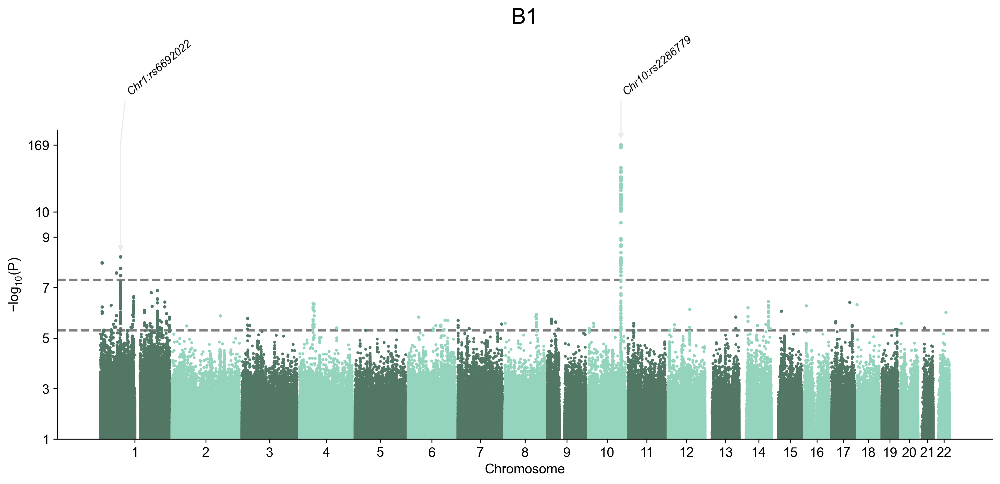

In [7]:
manhattan(B1,'B1',60,['rs6692022','rs2286779'],{'rs6692022':'Chr1:rs6692022','rs2286779':'Chr10:rs2286779'},save=True)

## B2

In [3]:
B2 = pd.read_csv('/Your_path/leiden_concat.cl2.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(B2)

'Chr2:rs574364844',
'Chr3:rs934673',
'Chr5:rs29767',
'Chr6:rs183178028',
'Chr7:rs186910283',
'Chr8:rs188848912',
'Chr9:rs72764834',
'Chr10:rs7910135',
'Chr11:rs116858295',
'Chr13:rs149996736',
'Chr16:rs146622556',
'Chr17:rs35802918',
'Chr19:rs144463955',
'Chr20:rs76466356',
'Chr22:rs112032147',


2025/10/14 19:20:39 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 19:20:39 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 19:20:39 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 19:20:39 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 19:20:57  -Reading columns          : Chr,Ref,Effect,Pos,Alt,AAF,Name,Pval,N,SE
2025/10/14 19:20:57  -Renaming columns to      : CHR,NEA,BETA,POS,EA,EAF,SNPID,P,N,SE
2025/10/14 19:20:57  -Current Dataframe shape : 45022647  x  10
2025/10/14 19:21:01  -Initiating a status column: STATUS ...
2025/10/14 19:21:01  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 19:21:05  -NEAF is specified...
2025/10/14 19:21:05  -Checking if 0<= NEAF <=1 ...
2025/10/14 19:21:08  -Converted NEAF to EAF.
2025/10/14 19:21:08  -Removed 0 variants with bad NEAF.
2025/10/14 19:21:09 Start to reorder the columns...v3.6.0
2025/10/14 19

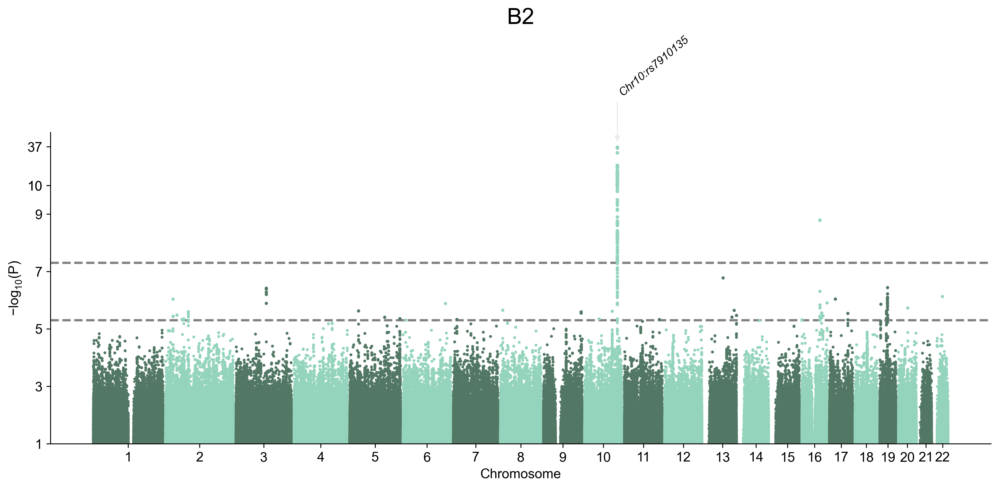

In [5]:
manhattan(B2,'B2',20,['rs7910135'],{'rs7910135':'Chr10:rs7910135'},save=True)

## B3

In [3]:
B3 = pd.read_csv('/Your_path/leiden_concat.cl3.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(B3)

'Chr1:rs186143763',
'Chr2:rs115514503',
'Chr4:rs72732448',
'Chr6:chr6:35832248_ATATTTATTTATT_A',
'Chr8:rs2676433',
'Chr9:rs575774369',
'Chr10:rs2286779',
'Chr10:rs4751995',
'Chr10:rs4751996',
'Chr10:rs7910135',
'Chr10:rs2301179',
'Chr11:rs35240020',
'Chr13:rs79282966',
'Chr16:rs181559731',


2025/10/14 19:31:20 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 19:31:20 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 19:31:20 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 19:31:20 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 19:31:39  -Reading columns          : Pval,Chr,Alt,Pos,AAF,Name,SE,Effect,N,Ref
2025/10/14 19:31:39  -Renaming columns to      : P,CHR,EA,POS,EAF,SNPID,SE,BETA,N,NEA
2025/10/14 19:31:39  -Current Dataframe shape : 45177055  x  10
2025/10/14 19:31:43  -Initiating a status column: STATUS ...
2025/10/14 19:31:43  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 19:31:47  -NEAF is specified...
2025/10/14 19:31:47  -Checking if 0<= NEAF <=1 ...
2025/10/14 19:31:50  -Converted NEAF to EAF.
2025/10/14 19:31:50  -Removed 0 variants with bad NEAF.
2025/10/14 19:31:50 Start to reorder the columns...v3.6.0
2025/10/14 19

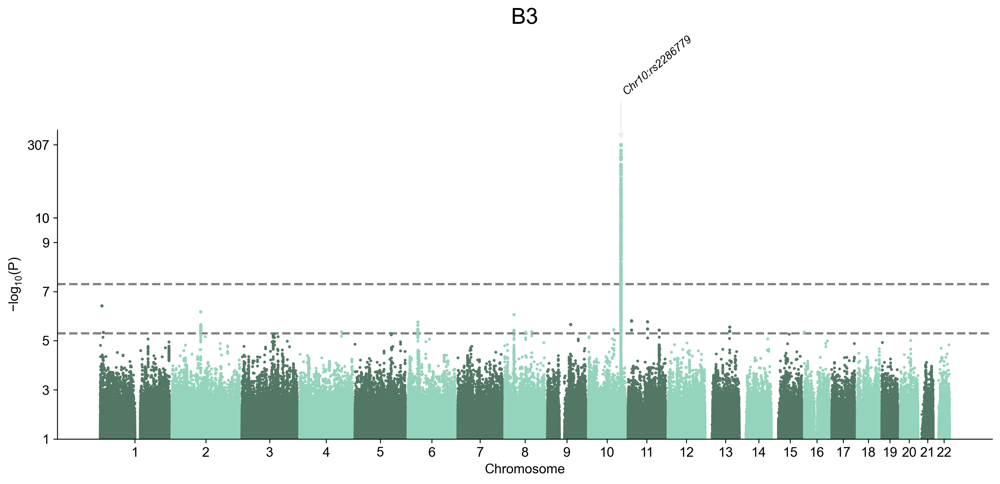

In [5]:
manhattan(B3,'B3',100,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B4

In [3]:
B4 = pd.read_csv('/Your_path/leiden_concat.cl4.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(B4)

'Chr1:rs12738869',
'Chr2:rs184556456',
'Chr3:rs11914379',
'Chr4:rs77174595',
'Chr5:rs569409804',
'Chr7:rs35056241',
'Chr9:rs111281340',
'Chr10:rs7910135',
'Chr11:rs897174797',
'Chr12:rs4763196',
'Chr15:rs35701313',
'Chr16:rs12928663',
'Chr18:chr18:2105081_TC_T',


2025/10/14 19:44:08 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 19:44:08 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 19:44:08 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 19:44:08 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 19:44:27  -Reading columns          : Pos,Alt,Chr,AAF,Ref,Name,N,Effect,SE,Pval
2025/10/14 19:44:27  -Renaming columns to      : POS,EA,CHR,EAF,NEA,SNPID,N,BETA,SE,P
2025/10/14 19:44:27  -Current Dataframe shape : 44931429  x  10
2025/10/14 19:44:30  -Initiating a status column: STATUS ...
2025/10/14 19:44:30  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 19:44:34  -NEAF is specified...
2025/10/14 19:44:34  -Checking if 0<= NEAF <=1 ...
2025/10/14 19:44:36  -Converted NEAF to EAF.
2025/10/14 19:44:36  -Removed 0 variants with bad NEAF.
2025/10/14 19:44:37 Start to reorder the columns...v3.6.0
2025/10/14 19

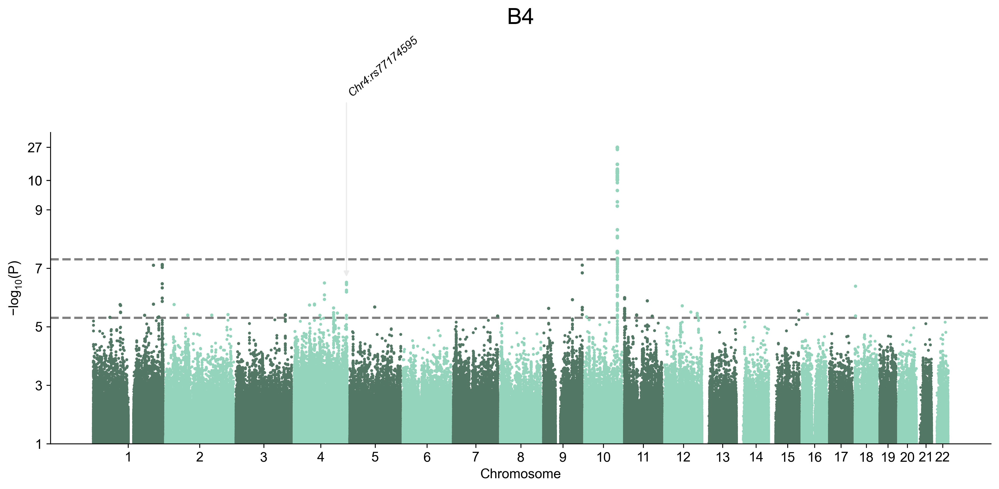

In [5]:
manhattan(B4,'B4',15,['rs77174595'],{'rs77174595':'Chr4:rs77174595'},save=True)

## B5

In [3]:
B5 = pd.read_csv('/Your_path/leiden_concat.cl5.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(B5)

'Chr1:rs115127139',
'Chr2:rs187100951',
'Chr3:rs13093683',
'Chr4:rs566187148',
'Chr5:rs9327638',
'Chr6:rs80019112',
'Chr7:rs535741939',
'Chr8:rs191865688',
'Chr9:rs692502',
'Chr10:rs2286779',
'Chr11:rs2034326',
'Chr12:rs1573991',
'Chr15:rs72747737',
'Chr16:rs533987953',
'Chr17:rs9906711',
'Chr18:rs111641747',
'Chr20:rs775925087',
'Chr21:chr21:41777714_T_TCACACACA',


2025/10/14 20:06:11 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 20:06:11 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 20:06:11 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 20:06:11 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 20:06:30  -Reading columns          : Pos,Ref,SE,Alt,N,Name,Chr,AAF,Effect,Pval
2025/10/14 20:06:30  -Renaming columns to      : POS,NEA,SE,EA,N,SNPID,CHR,EAF,BETA,P
2025/10/14 20:06:30  -Current Dataframe shape : 45068422  x  10
2025/10/14 20:06:33  -Initiating a status column: STATUS ...
2025/10/14 20:06:33  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 20:06:37  -NEAF is specified...
2025/10/14 20:06:37  -Checking if 0<= NEAF <=1 ...
2025/10/14 20:06:40  -Converted NEAF to EAF.
2025/10/14 20:06:40  -Removed 0 variants with bad NEAF.
2025/10/14 20:06:40 Start to reorder the columns...v3.6.0
2025/10/14 20

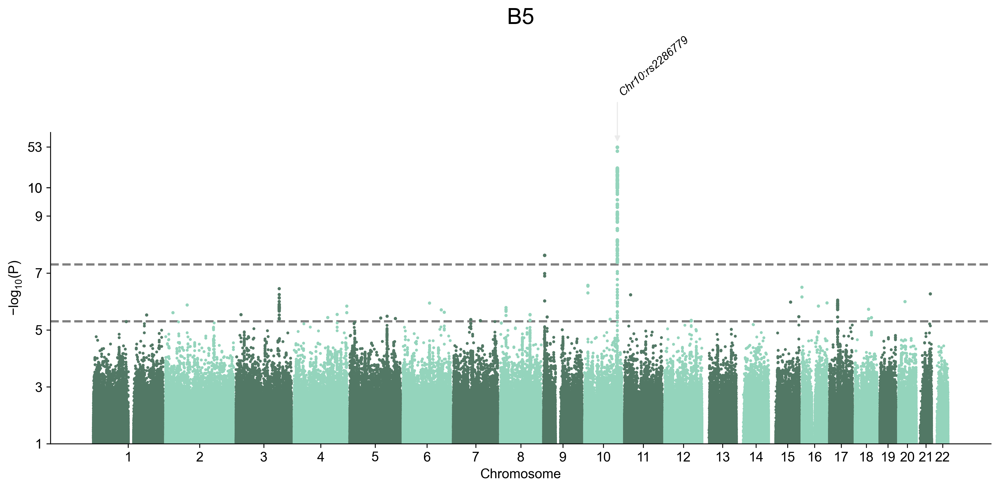

In [5]:
manhattan(B5,'B5',30,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B6

In [5]:
B6 = pd.read_csv('/Your_path/leiden_concat.cl6.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B6)

'Chr1:rs524338',
'Chr4:rs189840083',
'Chr6:rs142610046',
'Chr8:rs990712',
'Chr9:rs562319908',
'Chr9:rs529494798',
'Chr10:rs2286779',
'Chr13:rs549045098',
'Chr18:rs188233623',
'Chr19:rs1241462',


2025/10/14 20:30:47 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 20:30:47 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 20:30:47 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 20:30:47 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 20:31:05  -Reading columns          : Alt,Name,AAF,SE,Effect,Ref,N,Chr,Pval,Pos
2025/10/14 20:31:05  -Renaming columns to      : EA,SNPID,EAF,SE,BETA,NEA,N,CHR,P,POS
2025/10/14 20:31:05  -Current Dataframe shape : 44937898  x  10
2025/10/14 20:31:08  -Initiating a status column: STATUS ...
2025/10/14 20:31:08  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 20:31:12  -NEAF is specified...
2025/10/14 20:31:12  -Checking if 0<= NEAF <=1 ...
2025/10/14 20:31:15  -Converted NEAF to EAF.
2025/10/14 20:31:15  -Removed 0 variants with bad NEAF.
2025/10/14 20:31:15 Start to reorder the columns...v3.6.0
2025/10/14 20

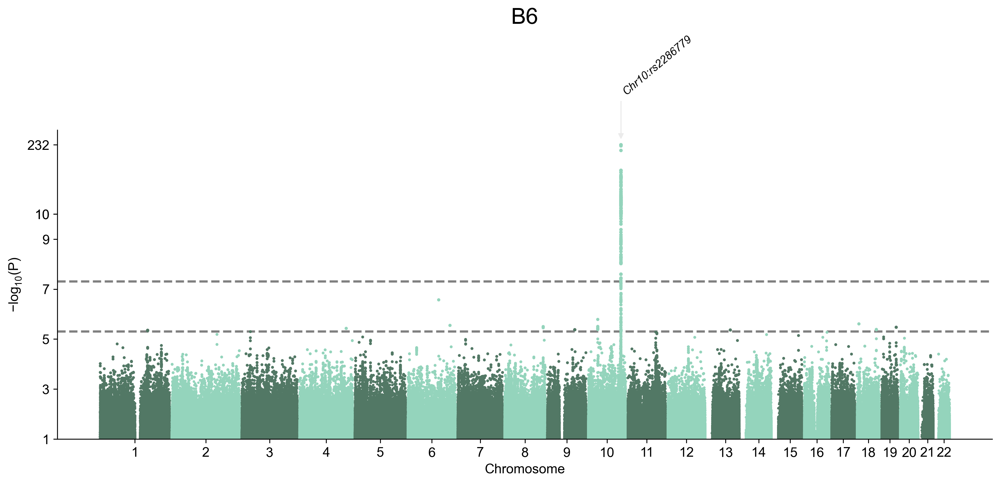

In [7]:
manhattan(B6,'B6',80,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B7

In [5]:
B7 = pd.read_csv('/Your_path/leiden_concat.cl7.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B7)

'Chr1:rs77323299',
'Chr2:rs12472064',
'Chr3:rs4685813',
'Chr4:rs58107016',
'Chr5:rs550799569',
'Chr6:rs28895061',
'Chr7:rs11983880',
'Chr8:rs13266153',
'Chr9:rs78469198',
'Chr10:rs11255507',
'Chr11:rs138471670',
'Chr12:chr12:92995012_TG_T',
'Chr13:rs111849827',
'Chr14:rs146564991',
'Chr15:rs79797279',
'Chr17:rs149748996',
'Chr18:rs200682670',


2025/10/14 20:39:05 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 20:39:05 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 20:39:05 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 20:39:05 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 20:39:23  -Reading columns          : N,Chr,Effect,Name,Pval,Alt,Pos,SE,AAF,Ref
2025/10/14 20:39:23  -Renaming columns to      : N,CHR,BETA,SNPID,P,EA,POS,SE,EAF,NEA
2025/10/14 20:39:23  -Current Dataframe shape : 44549789  x  10
2025/10/14 20:39:27  -Initiating a status column: STATUS ...
2025/10/14 20:39:27  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 20:39:32  -NEAF is specified...
2025/10/14 20:39:32  -Checking if 0<= NEAF <=1 ...
2025/10/14 20:39:35  -Converted NEAF to EAF.
2025/10/14 20:39:35  -Removed 0 variants with bad NEAF.
2025/10/14 20:39:35 Start to reorder the columns...v3.6.0
2025/10/14 20

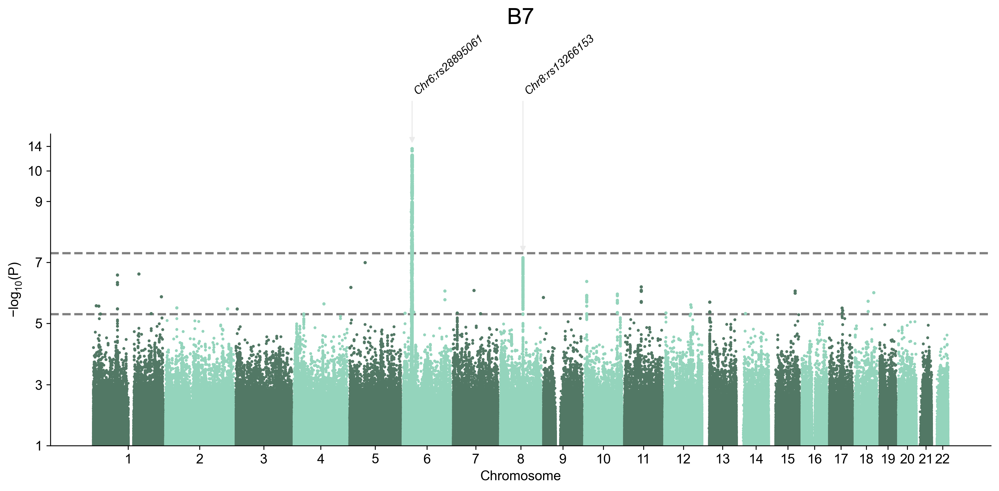

In [7]:
manhattan(B7,'B7',5,['rs28895061','rs13266153'],{'rs28895061':'Chr6:rs28895061','rs13266153':'Chr8:rs13266153'},save=True)

## B8

In [3]:
B8 = pd.read_csv('/Your_path/leiden_concat.cl8.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(B8)

'Chr1:rs34364548',
'Chr2:rs529321310',
'Chr6:rs34967069',
'Chr7:rs73156303',
'Chr10:rs2286779',
'Chr11:rs17415437',
'Chr14:chr14:29358386_T_TG',
'Chr18:rs9946908',
'Chr19:rs117758012',
'Chr20:rs182562326',
'Chr22:rs192363839',


2025/10/14 20:48:38 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 20:48:38 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 20:48:38 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 20:48:38 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 20:48:54  -Reading columns          : N,SE,Name,Chr,Pos,Pval,AAF,Alt,Effect,Ref
2025/10/14 20:48:54  -Renaming columns to      : N,SE,SNPID,CHR,POS,P,EAF,EA,BETA,NEA
2025/10/14 20:48:54  -Current Dataframe shape : 44374276  x  10
2025/10/14 20:48:57  -Initiating a status column: STATUS ...
2025/10/14 20:48:57  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 20:49:01  -NEAF is specified...
2025/10/14 20:49:01  -Checking if 0<= NEAF <=1 ...
2025/10/14 20:49:03  -Converted NEAF to EAF.
2025/10/14 20:49:03  -Removed 0 variants with bad NEAF.
2025/10/14 20:49:04 Start to reorder the columns...v3.6.0
2025/10/14 20

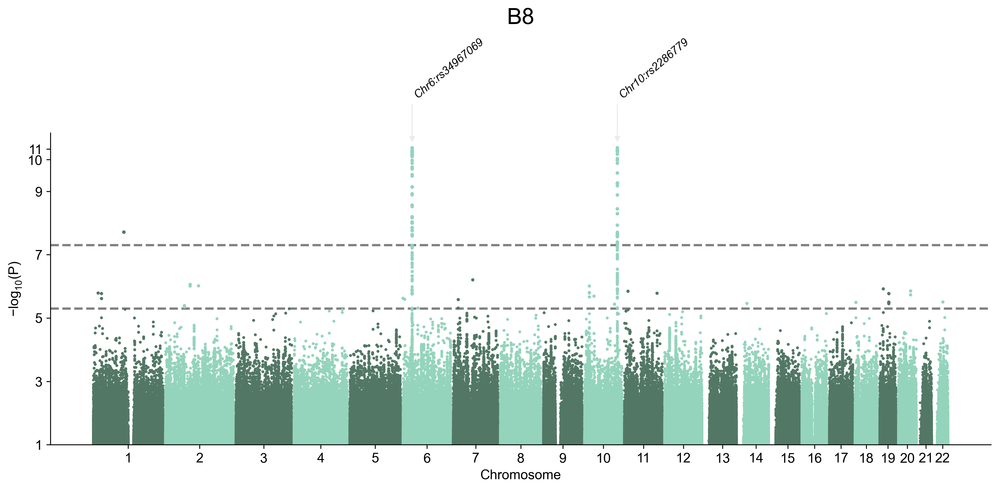

In [5]:
manhattan(B8,'B8',3,['rs34967069','rs2286779'],{'rs34967069':'Chr6:rs34967069','rs2286779':'Chr10:rs2286779'},save=True)

## B14

In [3]:
B14 = pd.read_csv('/Your_path/leiden_concat.cl14.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(B14)

'Chr3:rs565188504',
'Chr8:rs67654120',
'Chr9:rs138185836',
'Chr10:rs7910135',
'Chr15:rs143951831',
'Chr16:rs755708425',
'Chr17:rs77562336',
'Chr19:rs878609',


2025/10/14 20:56:54 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 20:56:54 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 20:56:54 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 20:56:54 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 20:57:11  -Reading columns          : Pos,Ref,Name,N,Alt,Effect,SE,Pval,AAF,Chr
2025/10/14 20:57:11  -Renaming columns to      : POS,NEA,SNPID,N,EA,BETA,SE,P,EAF,CHR
2025/10/14 20:57:11  -Current Dataframe shape : 44726434  x  10
2025/10/14 20:57:14  -Initiating a status column: STATUS ...
2025/10/14 20:57:14  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 20:57:18  -NEAF is specified...
2025/10/14 20:57:18  -Checking if 0<= NEAF <=1 ...
2025/10/14 20:57:21  -Converted NEAF to EAF.
2025/10/14 20:57:21  -Removed 0 variants with bad NEAF.
2025/10/14 20:57:21 Start to reorder the columns...v3.6.0
2025/10/14 20

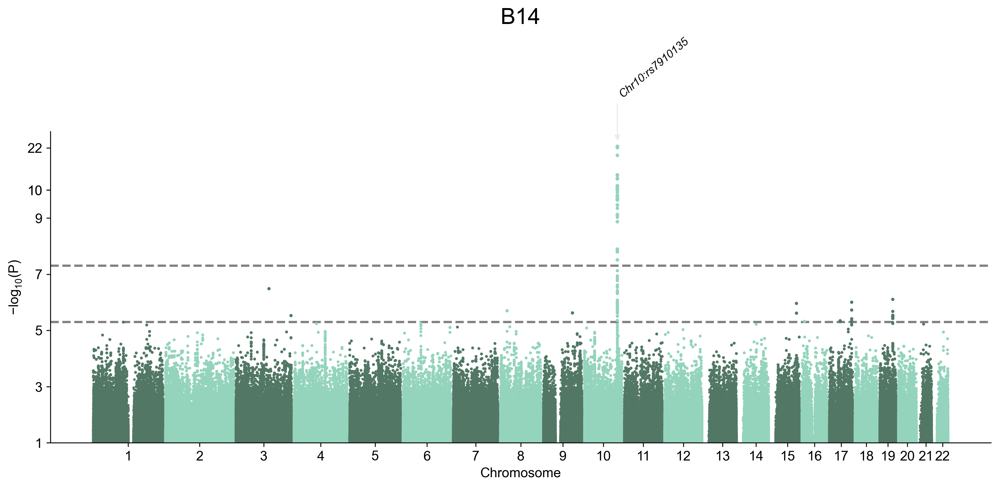

In [5]:
manhattan(B14,'B14',8,['rs7910135'],{'rs7910135':'Chr10:rs7910135'},save=True)

## B15

In [5]:
B15 = pd.read_csv('/Your_path/leiden_concat.cl15.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B15)

'Chr1:rs6662409',
'Chr3:rs542658880',
'Chr4:rs142483795',
'Chr5:rs773652739',
'Chr6:rs74813177',
'Chr9:rs140331624',
'Chr10:rs2286779',
'Chr11:rs544189165',
'Chr12:rs202131669',
'Chr13:rs117125150',
'Chr14:rs200978509',
'Chr15:rs8032228',
'Chr20:rs6109694',
'Chr21:rs62210285',


2025/10/14 21:04:51 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 21:04:51 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 21:04:51 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 21:04:51 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 21:05:07  -Reading columns          : Pos,SE,Effect,N,AAF,Name,Chr,Ref,Pval,Alt
2025/10/14 21:05:07  -Renaming columns to      : POS,SE,BETA,N,EAF,SNPID,CHR,NEA,P,EA
2025/10/14 21:05:07  -Current Dataframe shape : 44827237  x  10
2025/10/14 21:05:10  -Initiating a status column: STATUS ...
2025/10/14 21:05:10  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 21:05:14  -NEAF is specified...
2025/10/14 21:05:14  -Checking if 0<= NEAF <=1 ...
2025/10/14 21:05:16  -Converted NEAF to EAF.
2025/10/14 21:05:16  -Removed 0 variants with bad NEAF.
2025/10/14 21:05:17 Start to reorder the columns...v3.6.0
2025/10/14 21

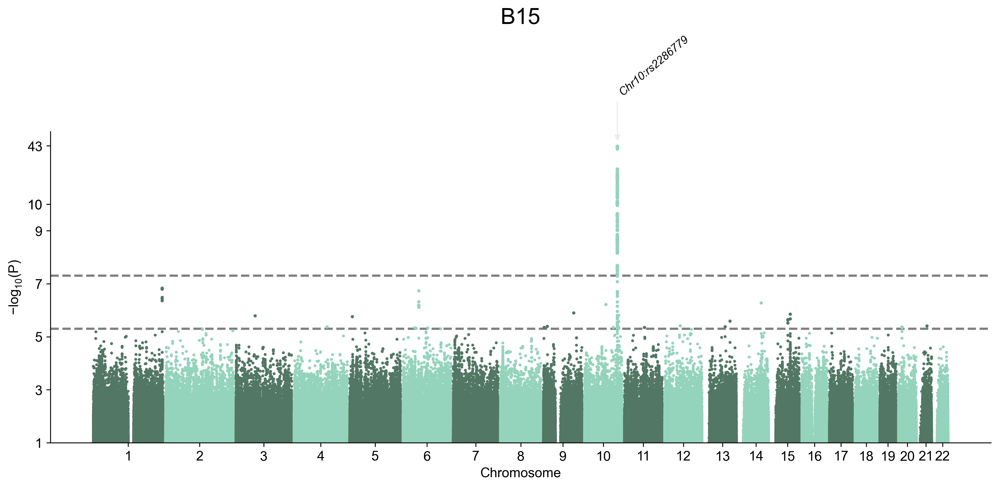

In [7]:
manhattan(B15,'B15',15,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B16

In [5]:
B16 = pd.read_csv('/Your_path/leiden_concat.cl16.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B16)

'Chr1:rs35184161',
'Chr2:rs10629611',
'Chr3:rs78823700',
'Chr4:rs116492037',
'Chr5:rs191453',
'Chr8:rs75576842',
'Chr9:rs539913121',
'Chr10:rs4751995',
'Chr11:rs78690751',
'Chr12:rs7313211',
'Chr13:rs1157207',
'Chr14:rs77497875',
'Chr15:rs188415743',
'Chr16:rs144562676',
'Chr18:rs143038106',
'Chr20:rs6081869',
'Chr22:rs78991320',


2025/10/14 21:36:11 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 21:36:11 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 21:36:11 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 21:36:11 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 21:36:28  -Reading columns          : AAF,SE,Name,Ref,Pval,Chr,N,Effect,Pos,Alt
2025/10/14 21:36:28  -Renaming columns to      : EAF,SE,SNPID,NEA,P,CHR,N,BETA,POS,EA
2025/10/14 21:36:28  -Current Dataframe shape : 44821971  x  10
2025/10/14 21:36:31  -Initiating a status column: STATUS ...
2025/10/14 21:36:31  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 21:36:35  -NEAF is specified...
2025/10/14 21:36:35  -Checking if 0<= NEAF <=1 ...
2025/10/14 21:36:37  -Converted NEAF to EAF.
2025/10/14 21:36:37  -Removed 0 variants with bad NEAF.
2025/10/14 21:36:38 Start to reorder the columns...v3.6.0
2025/10/14 21

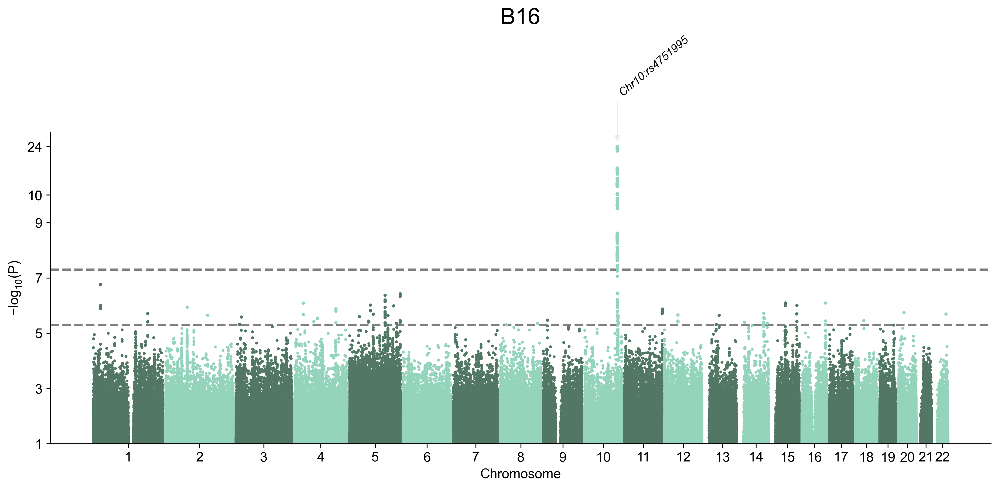

In [7]:
manhattan(B16,'B16',8,['rs4751995'],{'rs4751995':'Chr10:rs4751995'},save=True)

## B17

In [5]:
B17 = pd.read_csv('/Your_path/leiden_concat.cl17.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [6]:
sig_snps(B17)

'Chr1:rs71152349',
'Chr7:rs2906311',
'Chr8:rs28991894',
'Chr9:rs181589984',
'Chr10:rs2286779',
'Chr11:rs180918588',
'Chr12:rs193264651',
'Chr14:rs143690204',
'Chr15:rs117488884',
'Chr18:rs7242402',
'Chr19:rs117349207',
'Chr20:chr20:8089012_C_CTCT',
'Chr21:rs180936402',


2025/10/14 21:20:29 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 21:20:29 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 21:20:29 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 21:20:29 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 21:20:46  -Reading columns          : Pos,Name,AAF,N,Alt,Pval,Effect,SE,Chr,Ref
2025/10/14 21:20:46  -Renaming columns to      : POS,SNPID,EAF,N,EA,P,BETA,SE,CHR,NEA
2025/10/14 21:20:46  -Current Dataframe shape : 44765051  x  10
2025/10/14 21:20:49  -Initiating a status column: STATUS ...
2025/10/14 21:20:49  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 21:20:53  -NEAF is specified...
2025/10/14 21:20:53  -Checking if 0<= NEAF <=1 ...
2025/10/14 21:20:55  -Converted NEAF to EAF.
2025/10/14 21:20:55  -Removed 0 variants with bad NEAF.
2025/10/14 21:20:56 Start to reorder the columns...v3.6.0
2025/10/14 21

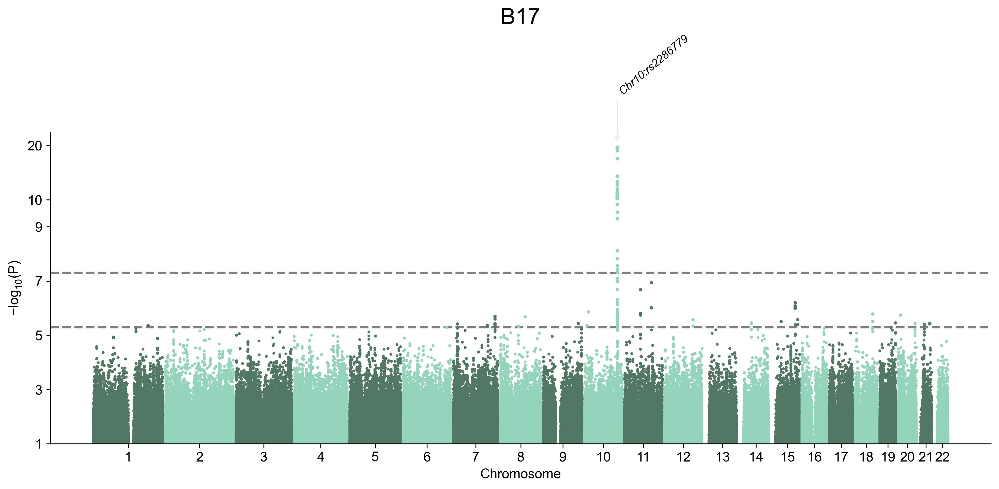

In [7]:
manhattan(B17,'B17',5,['rs2286779'],{'rs2286779':'Chr10:rs2286779'},save=True)

## B18

In [3]:
B18 = pd.read_csv('/Your_path/leiden_concat.cl18.REGENIE_WGR_PLOT_CONCAT_additive.lmm.tsv.gz', 
                 sep='\t', compression='gzip')

In [4]:
sig_snps(B18)

'Chr1:rs147550966',
'Chr2:rs62141903',
'Chr3:rs146037597',
'Chr4:rs17019737',
'Chr6:rs577399252',
'Chr8:rs78798639',
'Chr9:rs944606',
'Chr10:rs4751995',
'Chr11:rs138513426',
'Chr12:rs75047192',
'Chr13:rs550336453',
'Chr14:rs544551428',
'Chr15:rs201773890',
'Chr18:rs191550689',
'Chr19:rs62126286',
'Chr20:rs758882651',
'Chr22:rs11456612',


2025/10/14 21:44:06 GWASLab v3.6.0 https://cloufield.github.io/gwaslab/
2025/10/14 21:44:06 (C) 2022-2025, Yunye He, Kamatani Lab, GPL-3.0 license, gwaslab@gmail.com
2025/10/14 21:44:06 Python version: 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 18:02:02) 
[Clang 18.1.8 ]
2025/10/14 21:44:06 Start to initialize gl.Sumstats from pandas DataFrame ...
2025/10/14 21:44:23  -Reading columns          : Name,Chr,Alt,Pos,Pval,AAF,SE,N,Ref,Effect
2025/10/14 21:44:23  -Renaming columns to      : SNPID,CHR,EA,POS,P,EAF,SE,N,NEA,BETA
2025/10/14 21:44:23  -Current Dataframe shape : 45145887  x  10
2025/10/14 21:44:26  -Initiating a status column: STATUS ...
2025/10/14 21:44:26  -Genomic coordinates are based on GRCh37/hg19...
2025/10/14 21:44:30  -NEAF is specified...
2025/10/14 21:44:30  -Checking if 0<= NEAF <=1 ...
2025/10/14 21:44:33  -Converted NEAF to EAF.
2025/10/14 21:44:33  -Removed 0 variants with bad NEAF.
2025/10/14 21:44:34 Start to reorder the columns...v3.6.0
2025/10/14 21

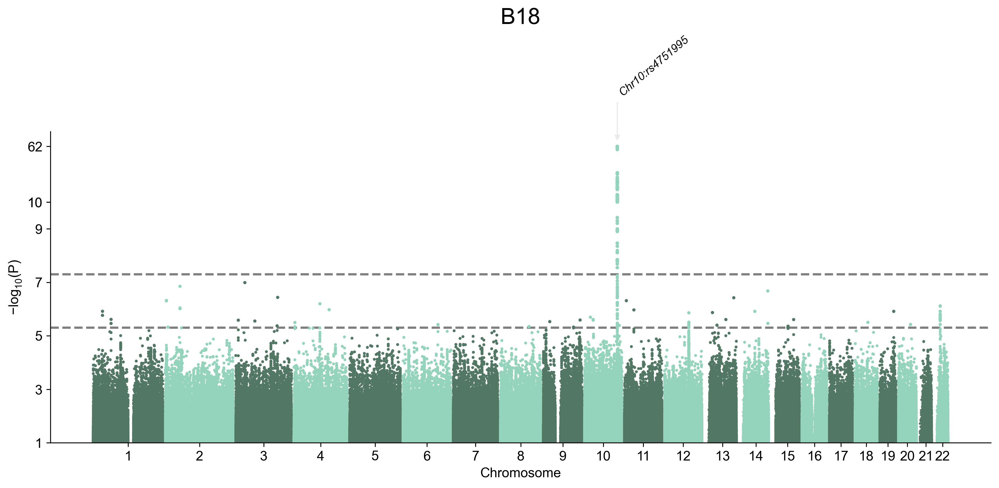

In [5]:
manhattan(B18,'B18',25,['rs4751995'],{'rs4751995':'Chr10:rs4751995'},save=True)